In [206]:
import netCDF4 as nc
import numpy as np
import matplotlib.pyplot as plt
from salishsea_tools import geo_tools, nc_tools, tidetools, viz_tools
import xarray as xr
from IPython.core.display import display, HTML
import scipy.signal as signal
import glob
import matplotlib.cm as cm
from matplotlib import animation, rc
import cmocean
display(HTML("<style>.container { width:90% !important; }</style>"))

%matplotlib inline

In [207]:
rc('animation', html='html5')

In [152]:
nowcast = xr.open_dataset('https://salishsea.eos.ubc.ca/erddap/griddap/ubcSSg3DTracerFields1hV17-02')

In [5]:
bathy = nc.Dataset('/data/vdo/MEOPAR/NEMO-forcing/grid/bathymetry_201702.nc')

In [200]:
grid = xr.open_dataset('/data/vdo/MEOPAR/NEMO-forcing/grid/bathymetry_201702.nc')
mesh_mask = nc.Dataset('/data/vdo/MEOPAR/NEMO-forcing/grid/mesh_mask201702.nc')

In [232]:
nemo_ji = np.array([(135,593), (132, 597), (130, 600), (127, 603), (125, 605), 
                    (124, 610), (123, 615), (122, 620), (120, 624), (122, 629)])
quadra_pts = np.array([(137,761), (143, 758), (149, 760)])

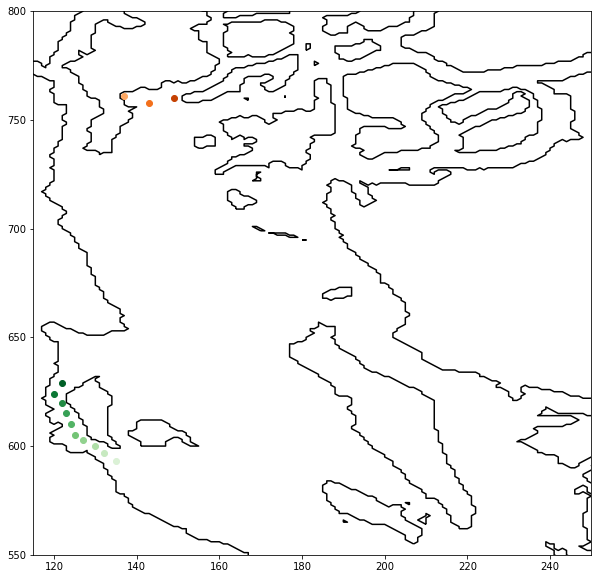

In [241]:
fig, ax = plt.subplots(figsize = (10,10))
colours = cm.Greens(np.linspace(0,1,13))
for pt, colour in zip(nemo_ji,colours[2:]):
    ax.plot(pt[0], pt[1], 'o', color=colour)
colours1 = cm.Oranges(np.linspace(0,1,6))
for pt, colour in zip(quadra_pts,colours1[2:]):
    ax.plot(pt[0], pt[1], 'o', color=colour)
ax.set_xlim(115,250)
ax.set_ylim(550,800)
viz_tools.plot_coastline(ax, bathy)

In [254]:
g = nc.Dataset('/ocean/vdo/MEOPAR/completed-runs/salinityanomilies/03dec14a/SalishSea_1h_20141203_20141212_grid_T.nc')

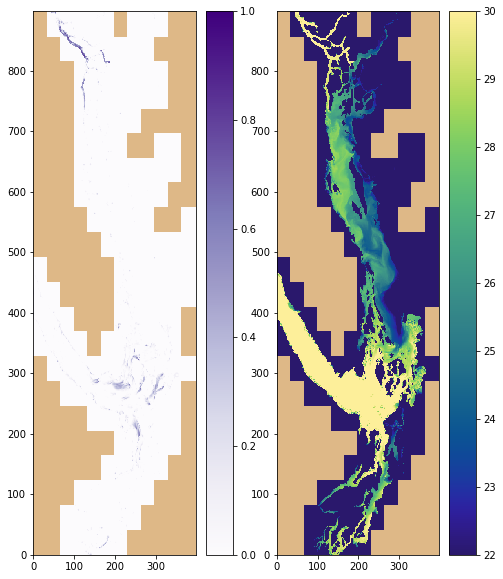

In [257]:
fig, ax = plt.subplots(1,2, figsize = (8,10))
trc = ax[0].pcolormesh(f.variables['mytracer'][0,0,...], vmin = 0, vmax = 1, cmap = 'Purples')
fig.colorbar(trc, ax = ax[0])
sal = ax[1].pcolormesh(g.variables['vosaline'][0,0,...], vmin = 22, vmax = 30, cmap = cmocean.cm.haline)
fig.colorbar(sal, ax=ax[1])

In [244]:
def salinity_and_wind(time_slice, files):
    N = 1
    Wn = 1/24
    B, A = signal.butter(N,Wn)
    colours = cm.Greens(np.linspace(0,1,13))
    fig,axs = plt.subplots(2,1, figsize=(30,15))
    for point, colour in zip(nemo_ji, colours[3:]):
        nemo_lon = grid.nav_lon.isel(y=point[1], x=point[0])
        nemo_lat = grid.nav_lat.isel(y=point[1], x=point[0])
        nemo_lon_lat = (np.asscalar(nemo_lon.values), np.asscalar(nemo_lat))
        atmos_ji = geo_tools.find_closest_model_point(
            nemo_lon_lat[0], nemo_lon_lat[1],
            atmos_grid.longitude.values - 360, atmos_grid.latitude.values,
            grid = "GEM2.5")
        u_wind_ts = (winds_data.u_wind
                     .isel(gridY=atmos_ji[0], gridX=atmos_ji[1])
                     .sel(time=time_slice))
        v_wind_ts = (winds_data.v_wind
                     .isel(gridY=atmos_ji[0], gridX=atmos_ji[1])
                     .sel(time=time_slice))
        rotated_u_winds, rotated_v_winds = viz_tools.rotate_vel(u_wind_ts.values, 
                                                           v_wind_ts.values, origin = 'map' )
        windfv = signal.filtfilt(B,A,rotated_v_winds)
        axs[0].plot(v_wind_ts.time, windfv, color = colour) 
        sal = (nowcast.salinity
              .isel(gridY = point[1], gridX = point[0])
              .sel(time=time_slice)
              .sel(depth = 0.5, method = 'nearest'))
        axs[1].plot(sal.time, sal.values, color = colour)
    axs[0].set_title('Filtered and Rotated V winds')
    axs[1].set_title('Salinity')
    with nc_tools.scDataset(files) as f:
        bs1 = f.variables['vosaline'][:,0,593,135]
        bs2 = f.variables['vosaline'][:,0,597,132]
        bs3 = f.variables['vosaline'][:,0,600,130]
        bs4 = f.variables['vosaline'][:,0,603,127]
        bs5 = f.variables['vosaline'][:,0,605,125]
        bs6 = f.variables['vosaline'][:,0,610,124]
        bs7 = f.variables['vosaline'][:,0,615,123]
        bs8 = f.variables['vosaline'][:,0,620,122]
        bs9 = f.variables['vosaline'][:,0,624,120]
        bs10 = f.variables['vosaline'][:,0,629,122]
        times = f.variables['time_counter'][:]
    dates = nc.num2date(times, 'seconds since 1900-01-01 00:00:00')
    axs[1].plot(dates, bs1, '--', color = colours[3])
    axs[1].plot(dates, bs2, '--', color = colours[4])
    axs[1].plot(dates, bs3, '--', color = colours[5])
    axs[1].plot(dates, bs4, '--', color = colours[6])
    axs[1].plot(dates, bs5, '--', color = colours[7])
    axs[1].plot(dates, bs6, '--', color = colours[8])
    axs[1].plot(dates, bs7, '--', color = colours[9])
    axs[1].plot(dates, bs8, '--', color = colours[10])
    axs[1].plot(dates, bs9, '--', color = colours[11])
    axs[1].plot(dates, bs10, '--', color = colours[12])
    axs[0].grid()
    axs[1].grid()

def wind_and_tracer(time_slice, files):
    with nc_tools.scDataset(files) as f:
        trc = f.variables['mytracer'][:,0,550:800,115:250]
        times = f.variables['time_counter'][:]
    fig,ax = plt.subplots(2,1,figsize=(8,8), gridspec_kw = {'height_ratios':[1, 2]})
    cropped_mask = 1 - mesh_mask.variables['tmask'][0,0,550:800,115:250]
    u_wind_ts = (winds_data.u_wind
                     .isel(gridY=163, gridX=109)
                     .sel(time=time_slice))
    v_wind_ts = (winds_data.v_wind
                     .isel(gridY=163, gridX=109)
                     .sel(time=time_slice))
    rotated_u_winds, rotated_v_winds = viz_tools.rotate_vel(u_wind_ts.values, 
                                                           v_wind_ts.values, origin = 'map' )
    u_wind_ts1 = (winds_data.u_wind
                 .isel(gridY=194, gridX=104)
                 .sel(time=time_slice))
    v_wind_ts1 = (winds_data.v_wind
                     .isel(gridY=194, gridX=104)
                     .sel(time=time_slice))
    rotated_u_winds1, rotated_v_winds1 = viz_tools.rotate_vel(u_wind_ts1.values, 
                                                           v_wind_ts1.values, origin = 'map' )
    windfu1 = signal.filtfilt(B,A, rotated_u_winds1)
    windfv1 = signal.filtfilt(B,A, rotated_v_winds1)
    windfu = signal.filtfilt(B,A, rotated_u_winds)
    windfv = signal.filtfilt(B,A,rotated_v_winds)
    def animate30(i):
        date = nc.num2date(times[i], 'seconds since 1900-01-01 00:00:00')
        ax[1].clear()
        ax[0].clear()
        cmap = plt.get_cmap('Purples')
        cmap.set_bad('burlywood')
        masked_trc1 = np.ma.masked_array(trc[i,...], mask = cropped_mask)
        den = ax[1].pcolormesh(masked_trc1, 
                      vmin=0, vmax = 1, cmap = cmap)
        ax[1].set_title(date) 
        ax[0].plot(winds_data.time.sel(time=time_slice), windfv, 'g-')
        ax[0].plot(winds_data.time.sel(time=time_slice), windfv1, 'r-')
        ax[0].grid('on')
        ax[0].set_ylim(-10,15)
        ax[0].plot((date, date), (-10,15), 'b--', color = 'black')
        ax[0].set_title('Filtered and Rotated V Winds')
        ax[1].set_title('Concentration of Tracer')
        return ax
    length = times.shape[0]
    interval = 0.25#in seconds
    ani40 = animation.FuncAnimation(fig,animate30,frames=length,interval=interval*1e+3, repeat=False)
    return ani40

def wind_and_salinity_video(time_slice, files):
    with nc_tools.scDataset(files) as f:
        sal = f.variables['vosaline'][:,0,550:800,115:250]
        times = f.variables['time_counter'][:]
    fig,ax = plt.subplots(2,1,figsize=(8,8), gridspec_kw = {'height_ratios':[1, 2]})
    cropped_mask = 1 - mesh_mask.variables['tmask'][0,0,550:800,115:250]
    u_wind_ts = (winds_data.u_wind
                     .isel(gridY=163, gridX=109)
                     .sel(time=time_slice))
    v_wind_ts = (winds_data.v_wind
                     .isel(gridY=163, gridX=109)
                     .sel(time=time_slice))
    rotated_u_winds, rotated_v_winds = viz_tools.rotate_vel(u_wind_ts.values, 
                                                           v_wind_ts.values, origin = 'map' )
    u_wind_ts1 = (winds_data.u_wind
                 .isel(gridY=194, gridX=104)
                 .sel(time=time_slice))
    v_wind_ts1 = (winds_data.v_wind
                     .isel(gridY=194, gridX=104)
                     .sel(time=time_slice))
    rotated_u_winds1, rotated_v_winds1 = viz_tools.rotate_vel(u_wind_ts1.values, 
                                                           v_wind_ts1.values, origin = 'map' )
    windfu1 = signal.filtfilt(B,A, rotated_u_winds1)
    windfv1 = signal.filtfilt(B,A, rotated_v_winds1)
    windfu = signal.filtfilt(B,A, rotated_u_winds)
    windfv = signal.filtfilt(B,A,rotated_v_winds)
    def animate30(i):
        date = nc.num2date(times[i], 'seconds since 1900-01-01 00:00:00')
        ax[1].clear()
        ax[0].clear()
        cmap = plt.get_cmap(cmocean.cm.haline)
        masked_sal1 = np.ma.masked_array(sal[i,...], mask = cropped_mask)
        den = ax[1].pcolormesh(masked_sal1, 
                               vmin=22, vmax = 30, cmap = cmap)
        ax[1].set_title(date) 
        ax[0].plot(winds_data.time.sel(time=time_slice), windfv, 'g-')
        ax[0].plot(winds_data.time.sel(time=time_slice), windfv1, 'r-')
        ax[0].grid('on')
        ax[0].set_ylim(-10,15)
        ax[0].plot((date, date), (-10,15), 'b--', color = 'black')
        ax[0].set_title('Filtered and Rotated V Winds')
        ax[1].set_title('Salinity')
        return ax
    length = times.shape[0]
    interval = 0.25#in seconds
    ani40 = animation.FuncAnimation(fig,animate30,frames=length,interval=interval*1e+3, repeat=False)
    return ani40

# November 23 - December 15, 2015

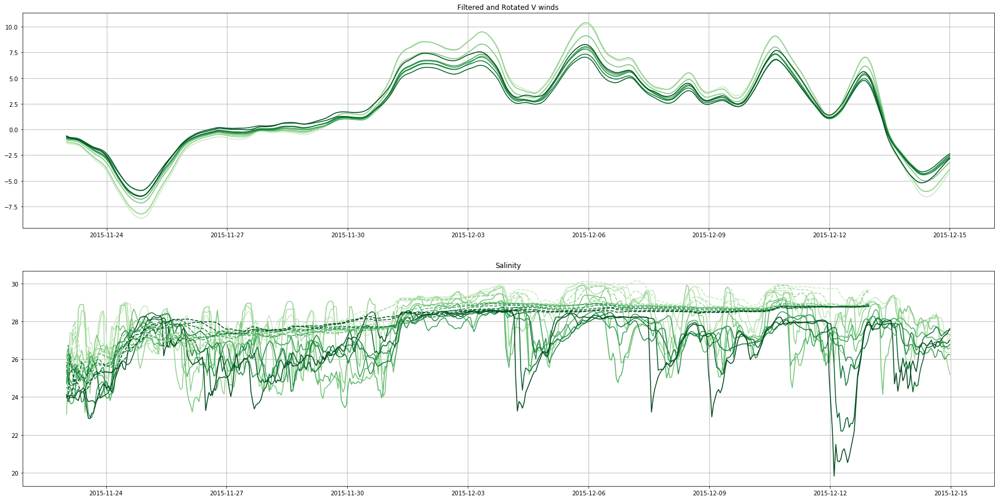

In [186]:
nov2315 = sorted(glob.glob('/ocean/vdo/MEOPAR/completed-runs/salinityanomilies/23nov15*/*1h*grid_T*'))
salinity_and_wind(slice('2015-11-23 0:00:00', '2015-12-15 0:00:00'), nov2315)

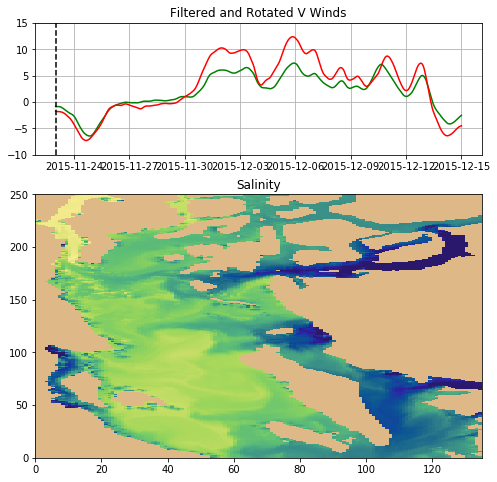

In [264]:
wind_and_salinity_video(slice('2015-11-23 0:00:00', '2015-12-15 0:00:00'), nov2315)

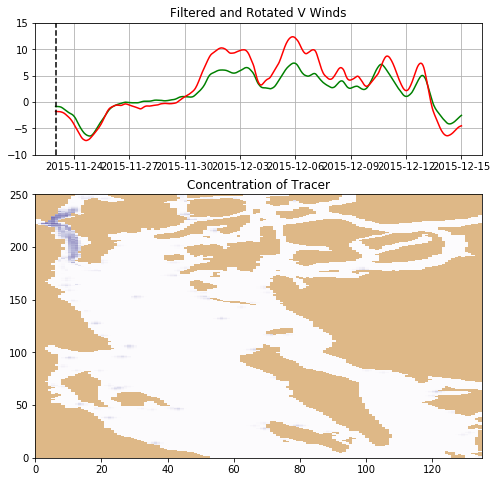

In [265]:
nov2315b = sorted(glob.glob('/ocean/vdo/MEOPAR/completed-runs/salinityanomilies/23nov15*/*1h*ptrc_T*'))
wind_and_tracer(slice('2015-11-23 0:00:00', '2015-12-15 0:00:00'), nov2315b)

# January 7 - 26, 2016

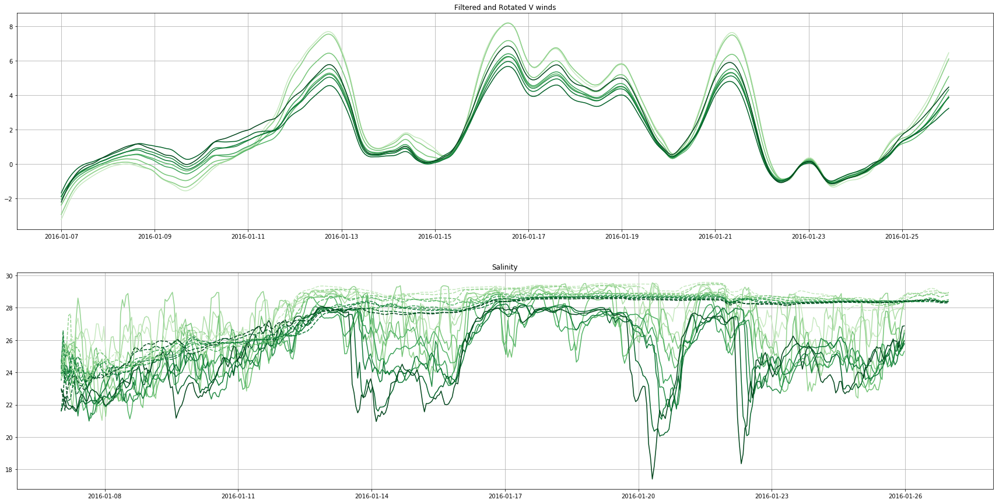

In [188]:
jan0716 = sorted(glob.glob('/ocean/vdo/MEOPAR/completed-runs/salinityanomilies/07jan16*/*1h*grid_T*'))
salinity_and_wind(slice('2016-01-07 0:00:00', '2016-01-26 0:00:00'), jan0716)

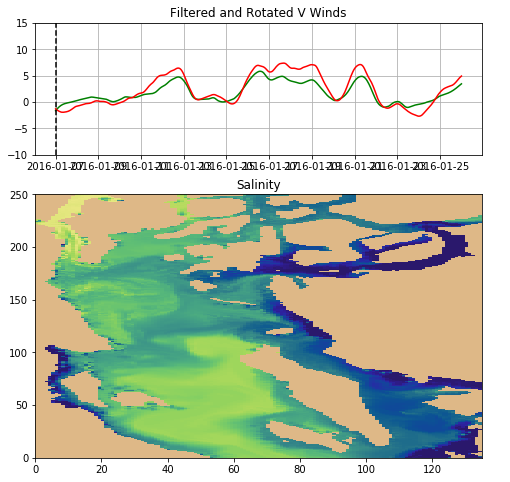

In [268]:
wind_and_salinity_video(slice('2016-01-07 0:00:00', '2016-01-26 0:00:00'), jan0716)

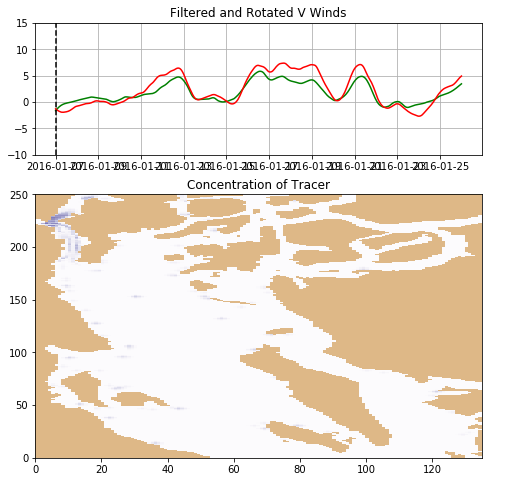

In [269]:
jan0716b = sorted(glob.glob('/ocean/vdo/MEOPAR/completed-runs/salinityanomilies/07jan16*/*1h*ptrc_T*'))
wind_and_tracer(slice('2016-01-07 0:00:00', '2016-01-26 0:00:00'), jan0716b)

# May 1 - 16, 2016

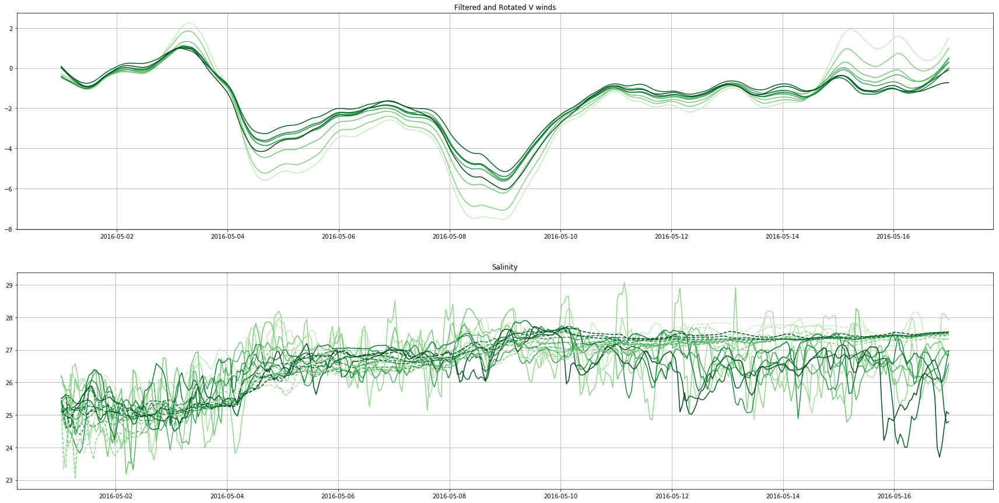

In [270]:
may0216 = sorted(glob.glob('/ocean/vdo/MEOPAR/completed-runs/salinityanomilies/01ma*/*1h*grid_T*'))
salinity_and_wind(slice('2016-05-01 00:00:00', '2016-05-17 00:00:00'), may0216)

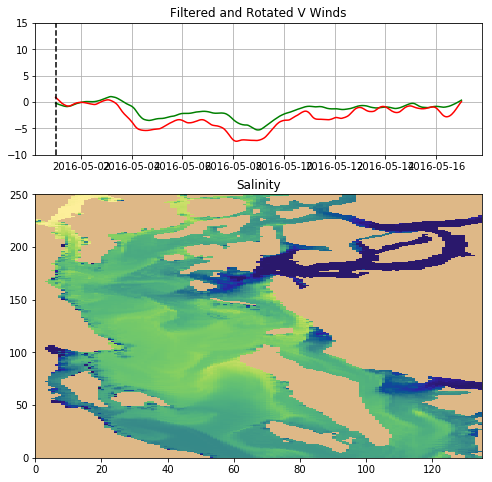

In [271]:
wind_and_salinity_video(slice('2016-05-01 00:00:00', '2016-05-17 00:00:00'), may0216)

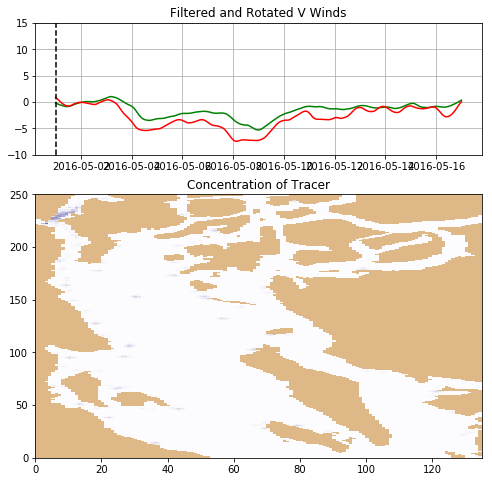

In [273]:
may0216b = sorted(glob.glob('/ocean/vdo/MEOPAR/completed-runs/salinityanomilies/01ma*/*1h*ptrc_T*'))
wind_and_tracer(slice('2016-05-01 00:00:00', '2016-05-17 00:00:00'), may0216b)

(100, 150)

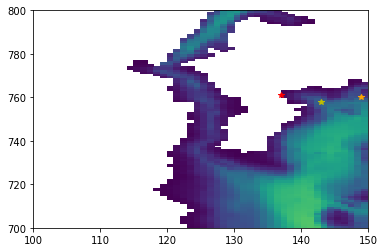

In [6]:
plt.pcolormesh(bathy.variables['Bathymetry'][:])
plt.plot(137, 761, 'r*')
plt.plot(143, 758, 'y*')
plt.plot(149, 760, '*', color='orange')
plt.ylim(700,800)
plt.xlim(100,150)

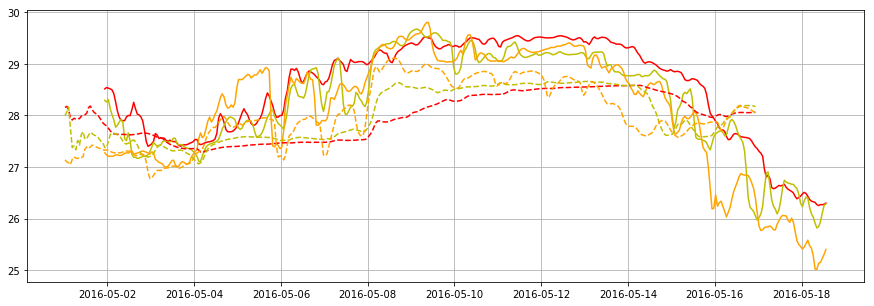

In [118]:
fig, ax = plt.subplots(figsize = (15,5))
dates = nc.num2date(nowcast.variables['time'][14350:14750], nowcast.variables['time'].units)
ax.plot(dates, nowcast.variables['salinity'][14350:14750, 0, 761, 137], 'r-')
ax.plot(dates, nowcast.variables['salinity'][14350:14750, 0, 758, 143], 'y-')
ax.plot(dates, nowcast.variables['salinity'][14350:14750, 0, 760, 149], '-', color= 'orange')
dates = nc.num2date(times[:-1], 'seconds since 1900-01-01 00:00:00')
ax.plot(dates, q1[:-1], 'r--')
ax.plot(dates, q2[:-1], 'y--')
ax.plot(dates, q3[:-1], '--', color= 'orange')
ax.grid('on')